In [1]:
!cp -r /kaggle/input/identify-the-birds/* /kaggle/working/
!cp -r /kaggle/input/indian-birds/* /kaggle/working/
# !cp -r /kaggle/input/col671-model1/* /kaggle/working/

Found 7968 images belonging to 10 classes.
Found 1992 images belonging to 10 classes.


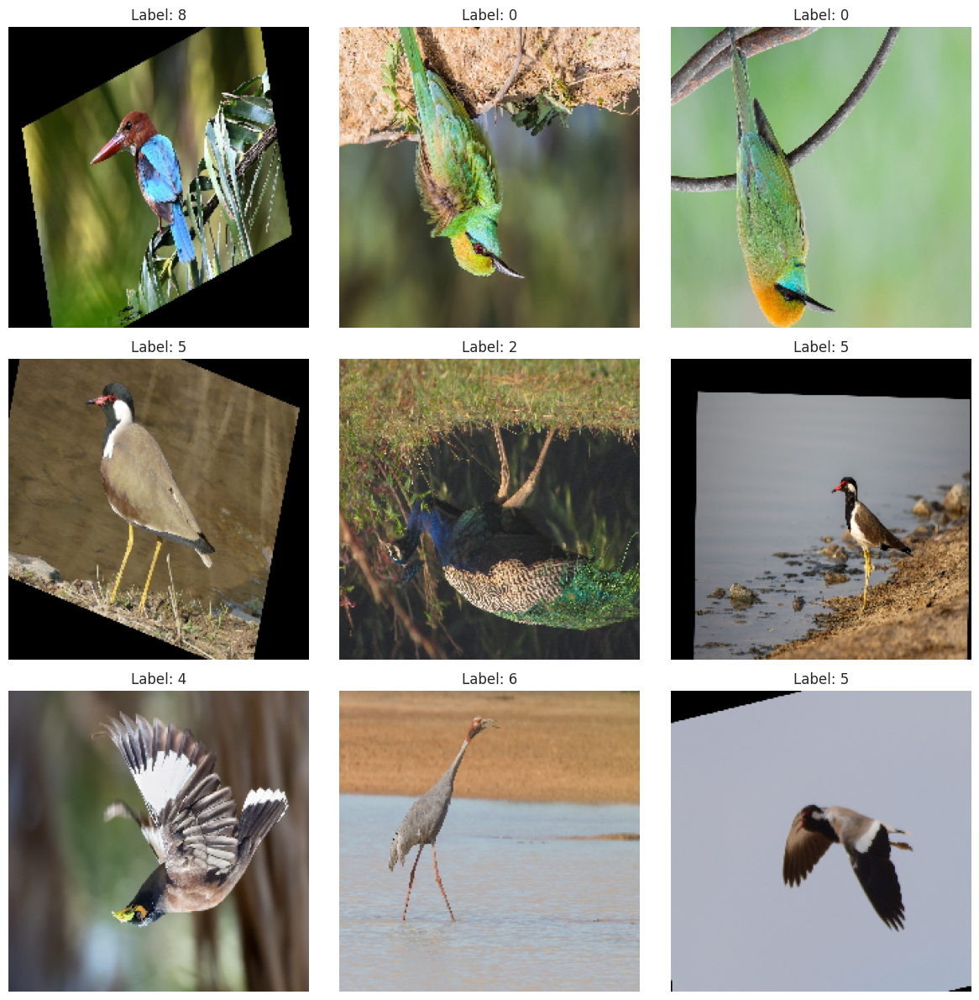

Number of Samples: 7968
Number of Classes: 10
Image Shape: (224, 224, 3)
Class Indices: {'0': 0, '1': 1, '2': 2, '3': 3, '4': 4, '5': 5, '6': 6, '7': 7, '8': 8, '9': 9}


/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1765: FutureWarning: unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.
  order = pd.unique(vector)


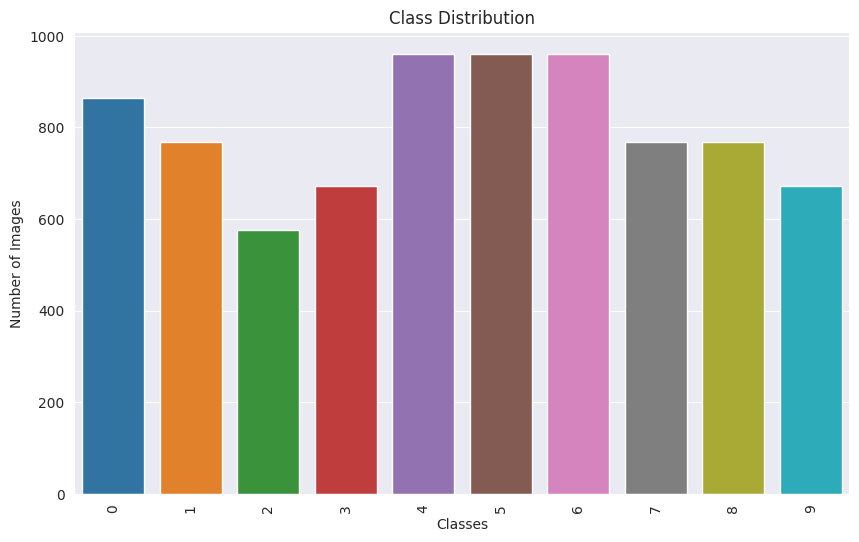

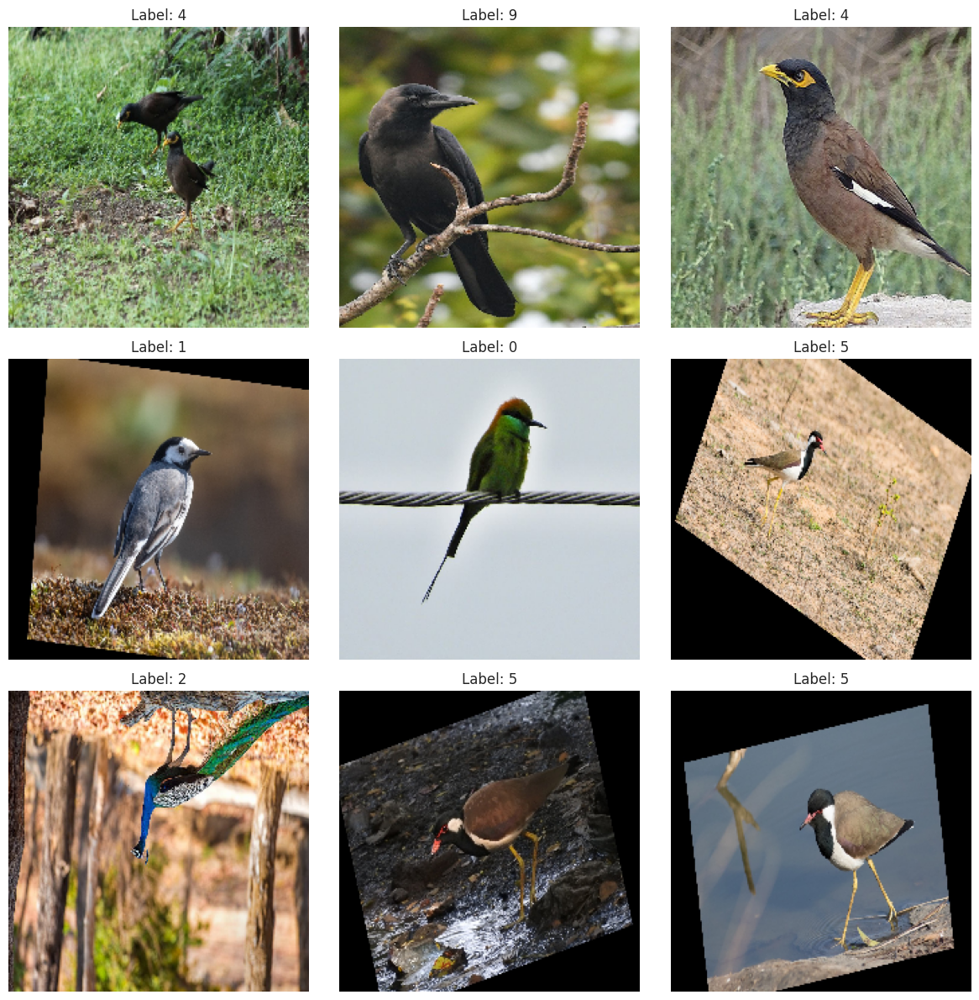

In [3]:
import numpy as np
import pandas as pd
import tensorflow as tf
from sklearn.model_selection import train_test_split
import itertools
import random
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import cv2
import seaborn as sns
from pathlib import Path
import os

# Tensorflow Libraries
from tensorflow import keras
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras import layers, models
from tensorflow.keras.layers import Dense, Dropout, BatchNormalization
from tensorflow.keras.callbacks import Callback, EarlyStopping, ModelCheckpoint, ReduceLROnPlateau
from tensorflow.keras.optimizers import Adam
from sklearn.metrics import classification_report, confusion_matrix

sns.set_style('darkgrid')

# Function to load dataset using ImageDataGenerator
def load_data(data_dir, img_size=(224, 224), batch_size=32, shuffle=True):
    data_gen = ImageDataGenerator(rescale=1./255, validation_split=0.2)

    train_generator = data_gen.flow_from_directory(
        data_dir,
        target_size=img_size,
        batch_size=batch_size,
        class_mode='categorical',
        subset='training',
        shuffle=shuffle
    )

    valid_generator = data_gen.flow_from_directory(
        data_dir,
        target_size=img_size,
        batch_size=batch_size,
        class_mode='categorical',
        subset='validation',
        shuffle=shuffle
    )

    return train_generator, valid_generator

# Function to visualize sample images from the dataset
# Function to visualize sample images from the dataset
def plot_sample_images(data_generator, class_names, n_rows=3, n_cols=3):
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(12, 12))
    axes = axes.flatten()
    
    # Get a batch of images and labels
    img_batch, label_batch = next(data_generator)
    
    for i in range(n_rows * n_cols):
        img = img_batch[i]  # Get the ith image
        label = np.argmax(label_batch[i])  # Convert one-hot encoding to class label
        axes[i].imshow(img)
        axes[i].set_title(f'Label: {class_names[label]}')
        axes[i].axis('off')
    
    plt.tight_layout()
    plt.show()



# Function to plot class distribution
def plot_class_distribution(data_generator):
    class_labels = data_generator.classes
    class_names = list(data_generator.class_indices.keys())
    class_counts = np.bincount(class_labels)

    plt.figure(figsize=(10, 6))
    sns.barplot(x=class_names, y=class_counts)
    plt.title('Class Distribution')
    plt.xlabel('Classes')
    plt.ylabel('Number of Images')
    plt.xticks(rotation=90)
    plt.show()

# Function to plot a confusion matrix
def plot_confusion_matrix(y_true, y_pred, class_names):
    cm = confusion_matrix(y_true, y_pred)
    plt.figure(figsize=(10, 8))
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=class_names, yticklabels=class_names)
    plt.ylabel('Actual')
    plt.xlabel('Predicted')
    plt.title('Confusion Matrix')
    plt.show()

# Function to calculate basic dataset statistics
def dataset_statistics(data_generator):
    n_samples = data_generator.samples
    n_classes = len(data_generator.class_indices)
    img_shape = data_generator.image_shape
    print(f'Number of Samples: {n_samples}')
    print(f'Number of Classes: {n_classes}')
    print(f'Image Shape: {img_shape}')
    print(f'Class Indices: {data_generator.class_indices}')

# Function to evaluate model performance and generate classification report
def evaluate_model(model, data_generator):
    y_true = data_generator.classes
    y_pred = model.predict(data_generator)
    y_pred = np.argmax(y_pred, axis=1)
    
    class_names = list(data_generator.class_indices.keys())
    print(classification_report(y_true, y_pred, target_names=class_names))
    
    # Plot confusion matrix
    plot_confusion_matrix(y_true, y_pred, class_names)

# Main EDA function
def perform_eda(data_dir):
    # Load the dataset
    train_gen, valid_gen = load_data(data_dir)

    # Plot sample images
    class_names = list(train_gen.class_indices.keys())
    plot_sample_images(train_gen, class_names)

    # Display dataset statistics
    dataset_statistics(train_gen)

    # Plot class distribution
    plot_class_distribution(train_gen)

    # Sample visualization on validation data
    plot_sample_images(valid_gen, class_names)

    # You can also train and evaluate the model here if needed
    # model = your_model()  # Define your model
    # model.compile(optimizer=Adam(), loss='categorical_crossentropy', metrics=['accuracy'])
    # model.fit(train_gen, validation_data=valid_gen, epochs=10)

    # Evaluate the model on validation data if trained
    # evaluate_model(model, valid_gen)

# Provide the path to your dataset directory
data_dir = '/kaggle/working/Birds/train/'

# Perform EDA
perform_eda(data_dir)


In [3]:
import torch
import numpy as np
import random
import torchvision.transforms as transforms
from torchvision import datasets, transforms
import os
from torch.utils.data import DataLoader
import torch
import torch.nn as nn
import torch.optim as optim
from torch.optim.lr_scheduler import CyclicLR, StepLR
from torch.utils.data import DataLoader
from torchvision import datasets, transforms
import torch.nn.functional as F
import numpy as np
import time

# Check if CUDA is available and use it
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

def set_seed(seed=42):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    if torch.cuda.is_available():
        torch.cuda.manual_seed(seed)
        torch.cuda.manual_seed_all(seed)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False
    torch.set_num_threads(1)

def worker_init_fn(worker_id):
    np.random.seed(42 + worker_id)

set_seed(42)

# Class mapping from Birds_25 to our target 10 classes
class_mapping = {
    'Asian-Green-Bee-Eater': 0,
    'White-Wagtail': 1,
    'Indian-Peacock': 2,
    'Indian-Grey-Hornbill': 3,
    'Common-Myna': 4,
    'Red-Wattled-Lapwing': 5,
    'Sarus-Crane': 6,
    'Common-Rosefinch': 7,
    'White-Breasted-Kingfisher': 8,
    'House-Crow': 9
}

# Custom dataset to remap validation labels based on the mapping
class FilteredImageFolder(datasets.ImageFolder):
    def __init__(self, root, transform=None, class_mapping=None):
        super(FilteredImageFolder, self).__init__(root, transform=transform)
        self.class_mapping = class_mapping
        self.samples = self.filter_and_remap_samples()

    def filter_and_remap_samples(self):
        # Filter samples and remap labels based on the class_mapping
        filtered_samples = []
        for path, label in self.samples:
            class_name = os.path.basename(os.path.dirname(path))  # Extract folder name
            if class_name in self.class_mapping:
                remapped_label = self.class_mapping[class_name]
                filtered_samples.append((path, remapped_label))
        return filtered_samples
        
# Define transformations for the dataset
transform = transforms.Compose([
    transforms.Resize((64, 64)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

        
# Load the validation dataset using the custom class
valid_dataset = FilteredImageFolder(root='Birds_25/valid/', transform=transform, class_mapping=class_mapping)
valid_loader = DataLoader(valid_dataset, batch_size=128, shuffle=False, num_workers=4, pin_memory=True, worker_init_fn=worker_init_fn)


Performing EDA on dataset: /kaggle/working/Birds/train/
Total Images: 9960
Number of Classes: 10
Classes: ['9' '8' '7' '3' '0' '5' '2' '6' '1' '4']


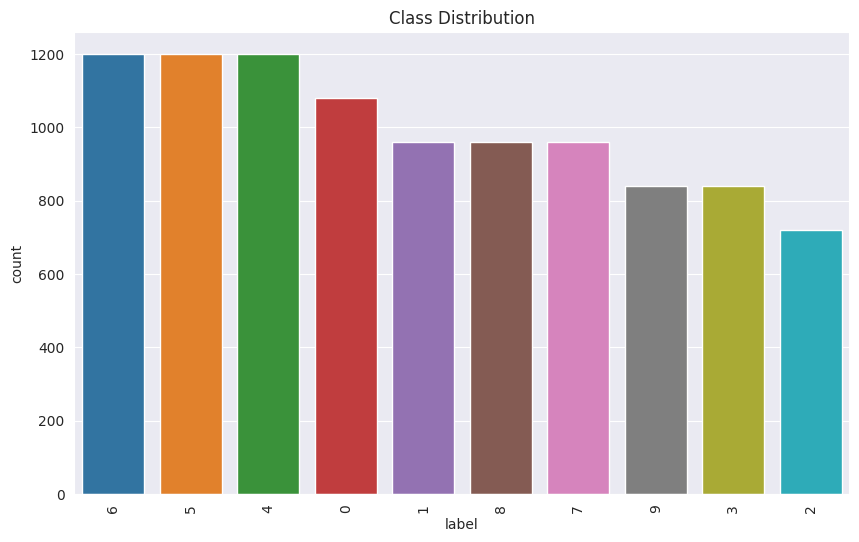

            height        width
count  9960.000000  9960.000000
mean    855.617871  1137.254317
std     156.021239   146.005166
min     303.000000   320.000000
25%     800.000000  1200.000000
50%     800.000000  1200.000000
75%     900.000000  1200.000000
max    1200.000000  1200.000000
Found 7968 images belonging to 10 classes.
Found 1992 images belonging to 10 classes.


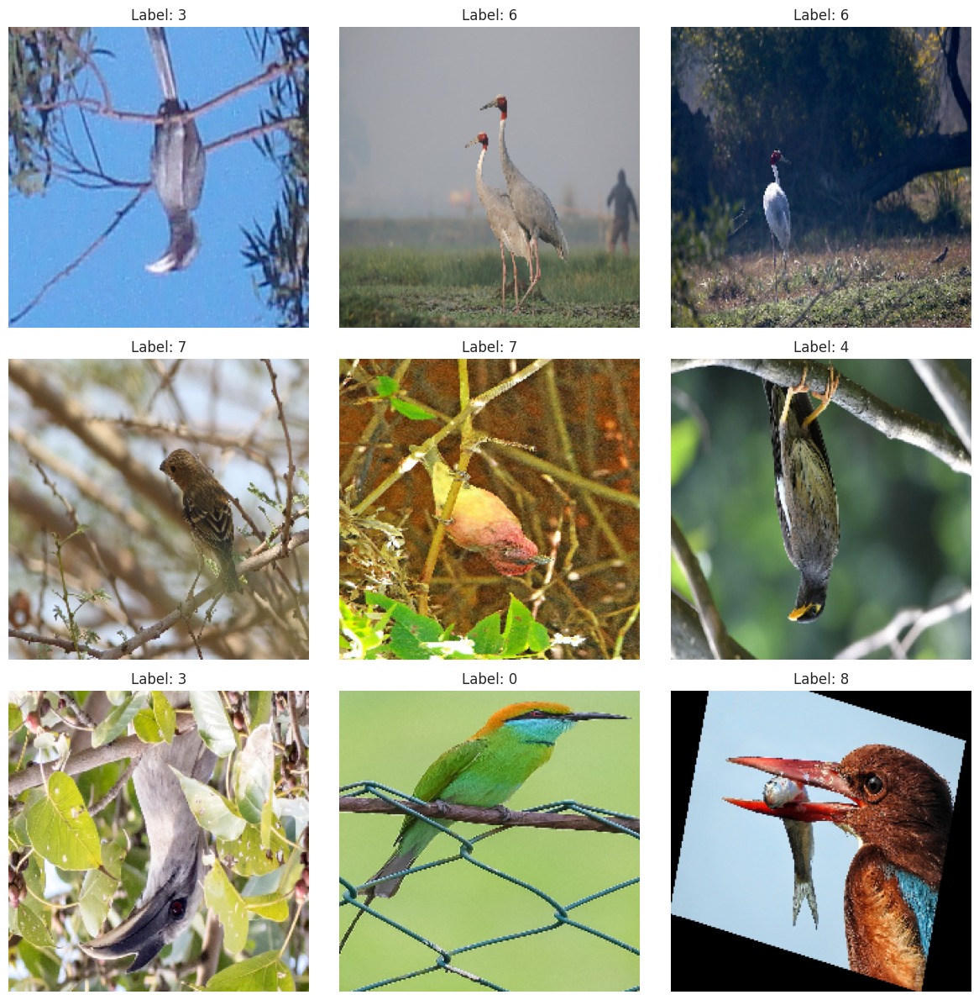

In [4]:
import numpy as np
import pandas as pd
import tensorflow as tf
import random
import matplotlib.pyplot as plt
import seaborn as sns
from pathlib import Path
import os
import cv2
from sklearn.metrics import classification_report, confusion_matrix
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Set style for visualizations
sns.set_style('darkgrid')

# Function to seed for reproducibility
def seed_everything(seed=42):
    np.random.seed(seed)
    random.seed(seed)
    tf.random.set_seed(seed)

seed_everything()

# Function to load image paths and labels using glob
def load_image_paths(data_dir):
    image_paths = list(Path(data_dir).rglob('*.jpg'))  # Modify extensions if needed
    labels = [path.parent.name for path in image_paths]
    df = pd.DataFrame({'image_path': image_paths, 'label': labels})
    return df

# Function to load and preprocess dataset
def load_data(data_dir, img_size=(224, 224), batch_size=32, shuffle=True):
    data_gen = ImageDataGenerator(rescale=1./255, validation_split=0.2)

    train_generator = data_gen.flow_from_directory(
        data_dir,
        target_size=img_size,
        batch_size=batch_size,
        class_mode='categorical',
        subset='training',
        shuffle=shuffle
    )

    valid_generator = data_gen.flow_from_directory(
        data_dir,
        target_size=img_size,
        batch_size=batch_size,
        class_mode='categorical',
        subset='validation',
        shuffle=shuffle
    )

    return train_generator, valid_generator

# Function to visualize sample images
def plot_sample_images(data_generator, class_names, n_rows=3, n_cols=3):
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(12, 12))
    axes = axes.flatten()
    
    # Fetch a batch of images and labels
    img_batch, label_batch = next(data_generator)
    
    for i in range(n_rows * n_cols):
        img = img_batch[i]
        label = np.argmax(label_batch[i])  # Convert one-hot encoding to class label
        axes[i].imshow(img)
        axes[i].set_title(f'Label: {class_names[label]}')
        axes[i].axis('off')
    
    plt.tight_layout()
    plt.show()

# Function to display dataset statistics
def dataset_statistics(df):
    print(f"Total Images: {len(df)}")
    print(f"Number of Classes: {df['label'].nunique()}")
    print(f"Classes: {df['label'].unique()}")

# Function to plot class distribution
def plot_class_distribution(df):
    plt.figure(figsize=(10, 6))
    sns.countplot(data=df, x='label', order=df['label'].value_counts().index)
    plt.xticks(rotation=90)
    plt.title('Class Distribution')
    plt.show()

# Function to show image sizes
def analyze_image_sizes(df):
    image_sizes = [cv2.imread(str(path)).shape[:2] for path in df['image_path']]
    df['height'] = [size[0] for size in image_sizes]
    df['width'] = [size[1] for size in image_sizes]
    print(df[['height', 'width']].describe())

# EDA function that wraps all the steps
def perform_eda(data_dir):
    print(f"Performing EDA on dataset: {data_dir}")
    
    # Load image paths and labels into DataFrame
    df = load_image_paths(data_dir)
    
    # Display dataset statistics
    dataset_statistics(df)
    
    # Plot class distribution
    plot_class_distribution(df)
    
    # Analyze and display image sizes
    analyze_image_sizes(df)
    
    # Load data generators for sample visualization
    train_gen, valid_gen = load_data(data_dir)
    class_names = list(train_gen.class_indices.keys())

    # Display random sample images from the training data
    plot_sample_images(train_gen, class_names)

# Path to your dataset directory
data_dir = '/kaggle/working/Birds/train/'

# Perform EDA
perform_eda(data_dir)


Performing EDA on dataset: /kaggle/working/Birds/train/
Total Images: 9960
Number of Classes: 10
Classes: ['9' '8' '7' '3' '0' '5' '2' '6' '1' '4']


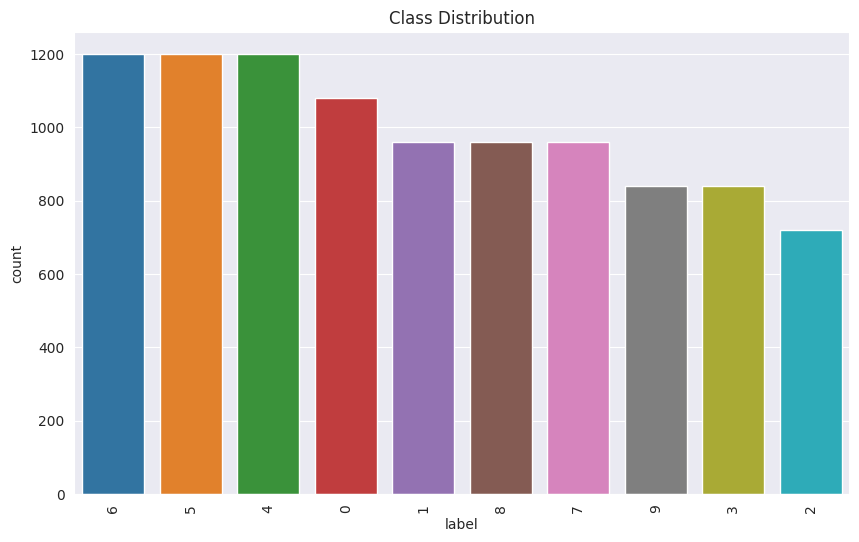

            height        width
count  9960.000000  9960.000000
mean    855.617871  1137.254317
std     156.021239   146.005166
min     303.000000   320.000000
25%     800.000000  1200.000000
50%     800.000000  1200.000000
75%     900.000000  1200.000000
max    1200.000000  1200.000000


/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


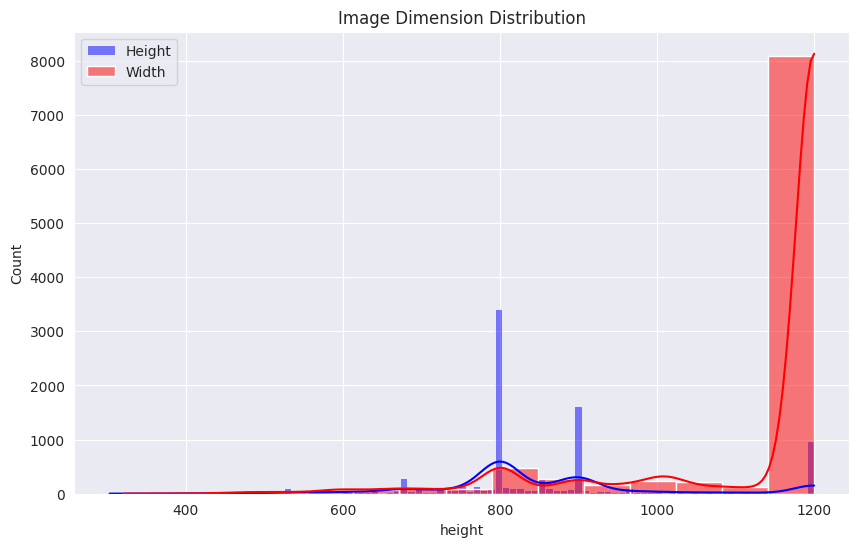

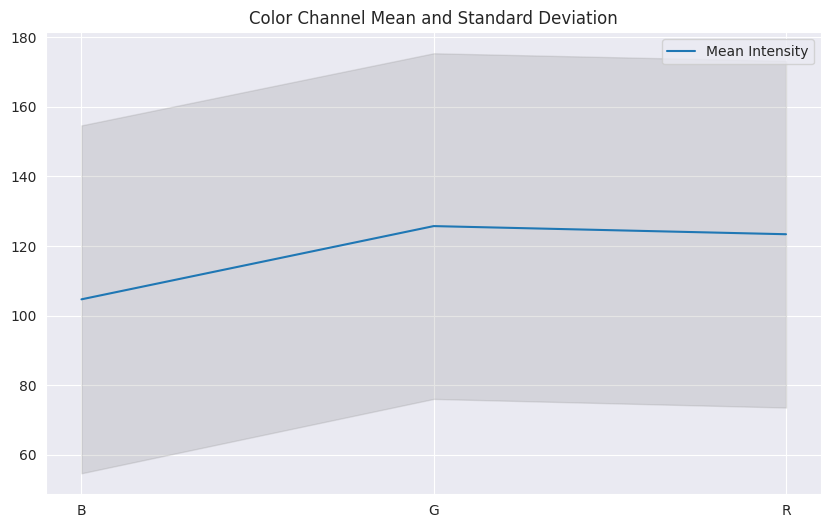

Found 7968 images belonging to 10 classes.
Found 1992 images belonging to 10 classes.


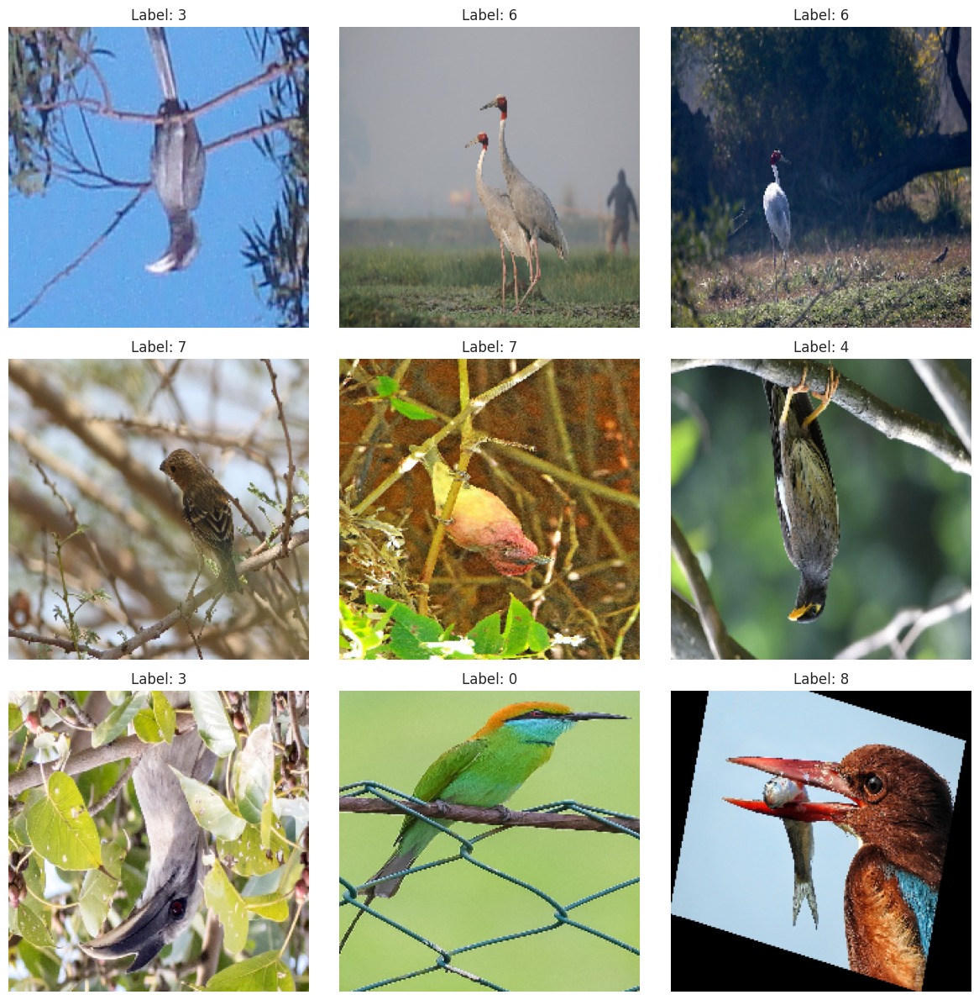

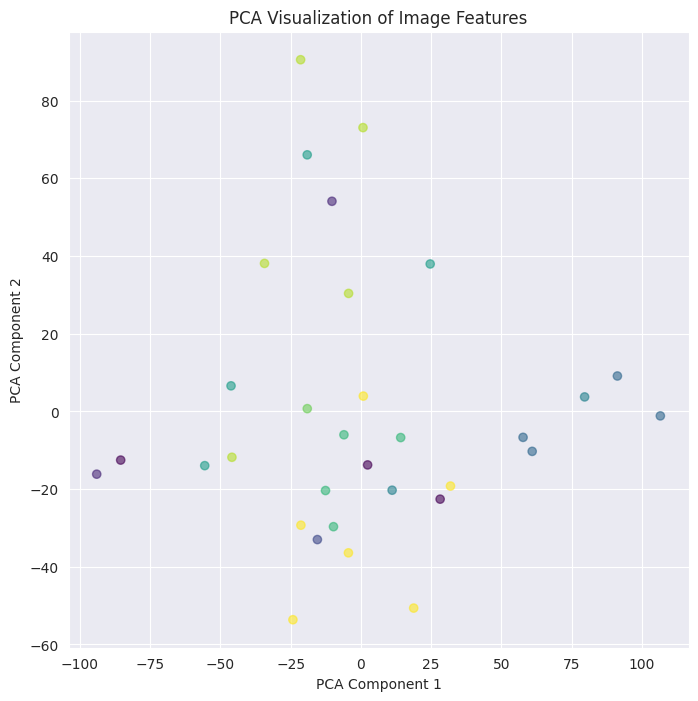

Found 9960 images belonging to 10 classes.


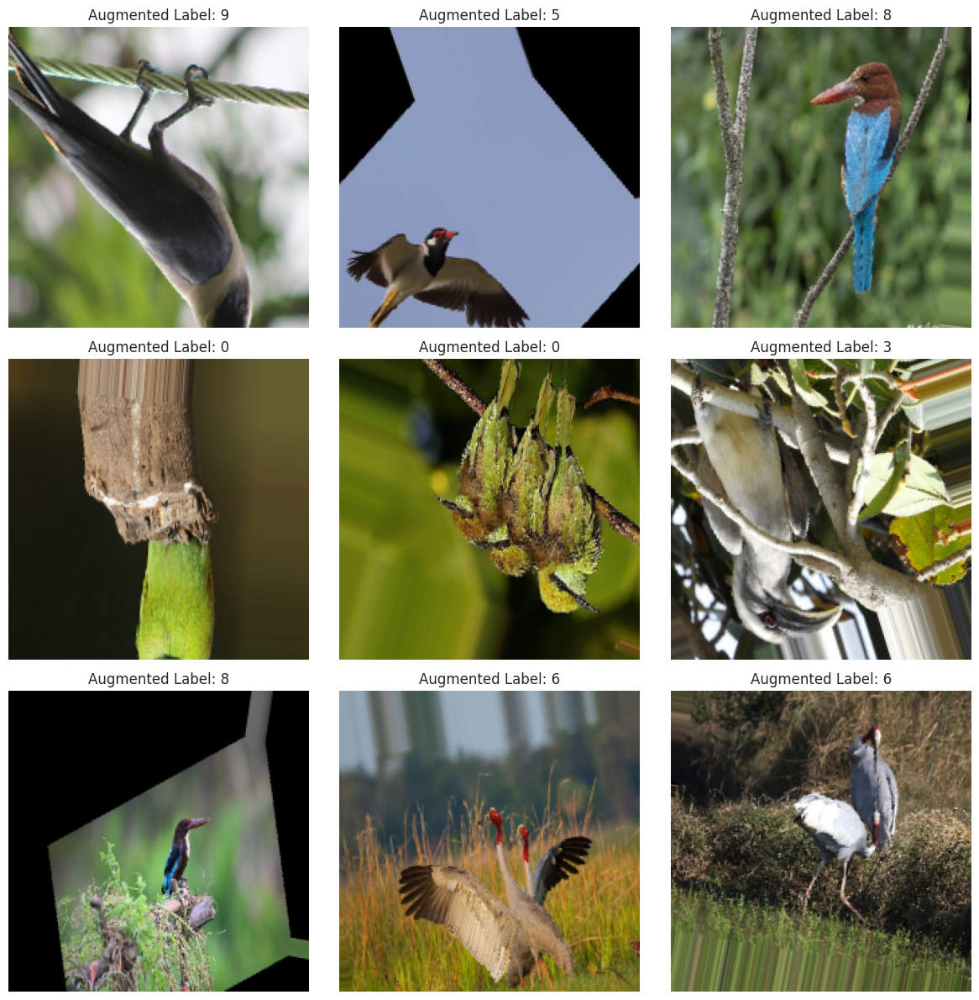

In [5]:
import numpy as np
import pandas as pd
import tensorflow as tf
import random
import matplotlib.pyplot as plt
import seaborn as sns
from pathlib import Path
import os
import cv2
from sklearn.metrics import classification_report, confusion_matrix
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.decomposition import PCA
import skimage
from skimage import exposure

# Set style for visualizations
sns.set_style('darkgrid')

# Function to seed for reproducibility
def seed_everything(seed=42):
    np.random.seed(seed)
    random.seed(seed)
    tf.random.set_seed(seed)

seed_everything()

# Function to load image paths and labels using glob
def load_image_paths(data_dir):
    image_paths = list(Path(data_dir).rglob('*.jpg'))  # Modify extensions if needed
    labels = [path.parent.name for path in image_paths]
    df = pd.DataFrame({'image_path': image_paths, 'label': labels})
    return df

# Function to load and preprocess dataset
def load_data(data_dir, img_size=(224, 224), batch_size=32, shuffle=True):
    data_gen = ImageDataGenerator(rescale=1./255, validation_split=0.2)

    train_generator = data_gen.flow_from_directory(
        data_dir,
        target_size=img_size,
        batch_size=batch_size,
        class_mode='categorical',
        subset='training',
        shuffle=shuffle
    )

    valid_generator = data_gen.flow_from_directory(
        data_dir,
        target_size=img_size,
        batch_size=batch_size,
        class_mode='categorical',
        subset='validation',
        shuffle=shuffle
    )

    return train_generator, valid_generator

# Function to visualize sample images
def plot_sample_images(data_generator, class_names, n_rows=3, n_cols=3):
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(12, 12))
    axes = axes.flatten()
    
    # Fetch a batch of images and labels
    img_batch, label_batch = next(data_generator)
    
    for i in range(n_rows * n_cols):
        img = img_batch[i]
        label = np.argmax(label_batch[i])  # Convert one-hot encoding to class label
        axes[i].imshow(img)
        axes[i].set_title(f'Label: {class_names[label]}')
        axes[i].axis('off')
    
    plt.tight_layout()
    plt.show()

# Function to display dataset statistics
def dataset_statistics(df):
    print(f"Total Images: {len(df)}")
    print(f"Number of Classes: {df['label'].nunique()}")
    print(f"Classes: {df['label'].unique()}")

# Function to plot class distribution
def plot_class_distribution(df):
    plt.figure(figsize=(10, 6))
    sns.countplot(data=df, x='label', order=df['label'].value_counts().index)
    plt.xticks(rotation=90)
    plt.title('Class Distribution')
    plt.show()

# Function to show image sizes
def analyze_image_sizes(df):
    image_sizes = [cv2.imread(str(path)).shape[:2] for path in df['image_path']]
    df['height'] = [size[0] for size in image_sizes]
    df['width'] = [size[1] for size in image_sizes]
    print(df[['height', 'width']].describe())
    
    # Plot histogram of image dimensions
    plt.figure(figsize=(10, 6))
    sns.histplot(df['height'], kde=True, color='blue', label='Height')
    sns.histplot(df['width'], kde=True, color='red', label='Width')
    plt.legend()
    plt.title('Image Dimension Distribution')
    plt.show()

# Function to analyze color channel distributions
def analyze_color_channels(df):
    means = []
    stds = []
    for path in df['image_path']:
        img = cv2.imread(str(path))
        means.append(np.mean(img, axis=(0, 1)))
        stds.append(np.std(img, axis=(0, 1)))
    
    means = np.array(means)
    stds = np.array(stds)
    
    plt.figure(figsize=(10, 6))
    plt.plot(['B', 'G', 'R'], np.mean(means, axis=0), label='Mean Intensity')
    plt.fill_between(['B', 'G', 'R'], np.mean(means, axis=0) - np.mean(stds, axis=0),
                     np.mean(means, axis=0) + np.mean(stds, axis=0), alpha=0.2, color='gray')
    plt.title('Color Channel Mean and Standard Deviation')
    plt.legend()
    plt.show()

# Function to perform PCA for feature correlation analysis
def pca_analysis(train_generator, n_components=2):
    batch = next(train_generator)
    images = batch[0]
    images_flat = images.reshape(images.shape[0], -1)
    pca = PCA(n_components=n_components)
    pca_result = pca.fit_transform(images_flat)
    
    plt.figure(figsize=(8, 8))
    plt.scatter(pca_result[:, 0], pca_result[:, 1], c=np.argmax(batch[1], axis=1), cmap='viridis', alpha=0.6)
    plt.title('PCA Visualization of Image Features')
    plt.xlabel('PCA Component 1')
    plt.ylabel('PCA Component 2')
    plt.show()

# Function to visualize augmented images
def plot_augmented_images(data_generator, class_names, n_rows=3, n_cols=3):
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(12, 12))
    axes = axes.flatten()
    
    img_batch, label_batch = next(data_generator)
    for i in range(n_rows * n_cols):
        img = img_batch[i]
        label = np.argmax(label_batch[i])
        axes[i].imshow(img)
        axes[i].set_title(f'Augmented Label: {class_names[label]}')
        axes[i].axis('off')
    
    plt.tight_layout()
    plt.show()

# EDA function that wraps all the steps
def perform_eda(data_dir):
    print(f"Performing EDA on dataset: {data_dir}")
    
    # Load image paths and labels into DataFrame
    df = load_image_paths(data_dir)
    
    # Display dataset statistics
    dataset_statistics(df)
    
    # Plot class distribution
    plot_class_distribution(df)
    
    # Analyze and display image sizes
    analyze_image_sizes(df)
    
    # Analyze color channels
    analyze_color_channels(df)
    
    # Load data generators for sample visualization
    train_gen, valid_gen = load_data(data_dir)
    class_names = list(train_gen.class_indices.keys())

    # Display random sample images from the training data
    plot_sample_images(train_gen, class_names)
    
    # PCA analysis for feature correlation
    pca_analysis(train_gen)
    
    # Visualize augmented images
    augmented_data_gen = ImageDataGenerator(
        rescale=1./255,
        rotation_range=20,
        width_shift_range=0.2,
        height_shift_range=0.2,
        shear_range=0.2,
        zoom_range=0.2,
        horizontal_flip=True,
        fill_mode='nearest'
    ).flow_from_directory(
        data_dir,
        target_size=(224, 224),
        batch_size=32,
        class_mode='categorical'
    )
    plot_augmented_images(augmented_data_gen, class_names)

# Path to your dataset directory
data_dir = '/kaggle/working/Birds/train/'

# Perform EDA
perform_eda(data_dir)

cutmix, classimbalance, cel and at 70 epoch change from cyclicLR to steupLR

In [10]:
startTime = time.time()

# Check if CUDA is available
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Define a Basic Block for ResNet
class BasicBlock(nn.Module):
    expansion = 1

    def __init__(self, in_planes, planes, stride=1, dropout_rate=0.0):
        super(BasicBlock, self).__init__()
        self.conv1 = nn.Conv2d(in_planes, planes, kernel_size=3, stride=stride, padding=1, bias=False)
        self.bn1 = nn.BatchNorm2d(planes)
        self.relu = nn.ReLU(inplace=True)
        self.dropout = nn.Dropout(dropout_rate)

        self.conv2 = nn.Conv2d(planes, planes, kernel_size=3, stride=1, padding=1, bias=False)
        self.bn2 = nn.BatchNorm2d(planes)

        # Shortcut connection
        self.shortcut = nn.Sequential()
        if stride != 1 or in_planes != self.expansion * planes:
            self.shortcut = nn.Sequential(
                nn.Conv2d(in_planes, self.expansion * planes, kernel_size=1, stride=stride, bias=False),
                nn.BatchNorm2d(self.expansion * planes)
            )

    def forward(self, x):
        out = self.conv1(x)
        out = self.bn1(out)
        out = self.relu(out)
        out = self.dropout(out)

        out = self.conv2(out)
        out = self.bn2(out)

        shortcut = self.shortcut(x)
        out += shortcut
        out = self.relu(out)
        return out

# Define ResNet-18 model
class CustomResNet18(nn.Module):
    def __init__(self, block, num_blocks, num_classes=10, dropout_rate=0.3):
        super(CustomResNet18, self).__init__()
        self.in_planes = 64

        self.conv1 = nn.Conv2d(3, 64, kernel_size=3, stride=1, padding=1, bias=False)
        self.bn1 = nn.BatchNorm2d(64)
        self.relu = nn.ReLU(inplace=True)

        # Layers
        self.layer1 = self._make_layer(block, 64, num_blocks[0], stride=1, dropout_rate=dropout_rate)
        self.layer2 = self._make_layer(block, 128, num_blocks[1], stride=2, dropout_rate=dropout_rate)
        self.layer3 = self._make_layer(block, 256, num_blocks[2], stride=2, dropout_rate=dropout_rate)
        self.layer4 = self._make_layer(block, 512, num_blocks[3], stride=2, dropout_rate=dropout_rate)

        self.avgpool = nn.AdaptiveAvgPool2d((1, 1))
        self.fc = nn.Linear(512 * block.expansion, num_classes)

    def _make_layer(self, block, planes, num_blocks, stride, dropout_rate):
        strides = [stride] + [1] * (num_blocks - 1)
        layers = []
        for stride in strides:
            layers.append(block(self.in_planes, planes, stride, dropout_rate=dropout_rate))
            self.in_planes = planes * block.expansion
        return nn.Sequential(*layers)

    def forward(self, x):
        x = self.conv1(x)
        x = self.bn1(x)
        x = self.relu(x)

        x = self.layer1(x)
        x = self.layer2(x)
        x = self.layer3(x)
        x = self.layer4(x)

        x = self.avgpool(x)
        x = torch.flatten(x, 1)
        x = self.fc(x)
        return x

# Instantiate the model with dropout rate
dropout_rate = 0.3  # Modify as needed
model = CustomResNet18(BasicBlock, [2, 2, 2, 2], num_classes=10, dropout_rate=dropout_rate).to(device)

# Define transformations for the dataset
transform = transforms.Compose([
    transforms.Resize((64, 64)),
    transforms.RandomHorizontalFlip(),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

# Load the dataset
train_dataset = datasets.ImageFolder(root='Birds/train/', transform=transform)
train_loader = DataLoader(train_dataset, batch_size=128, shuffle=True, num_workers=4, pin_memory=True, worker_init_fn=worker_init_fn)

from sklearn.utils.class_weight import compute_class_weight
import torch.nn as nn

# Assuming `train_loader` is your DataLoader for the training set
train_labels = []

for _, labels in train_loader:
    train_labels.extend(labels.numpy())  # Collect all labels

train_labels = np.array(train_labels)  # Convert to numpy array

# Assuming `train_labels` contains all labels in the training set
class_weights = compute_class_weight('balanced', classes=np.unique(train_labels), y=train_labels)
class_weights = torch.tensor(class_weights, dtype=torch.float32).to(device)
criterion = nn.CrossEntropyLoss(weight=class_weights)
# Define the loss function and optimizer
# criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)

# Define the cyclic learning rate scheduler
scheduler = CyclicLR(optimizer, base_lr=0.001, max_lr=0.01, step_size_up=20, mode='triangular2')


def rand_bbox(size, lam):
    W = size[2]
    H = size[3]
    cut_rat = np.sqrt(1. - lam)
    cut_w = int(W * cut_rat)
    cut_h = int(H * cut_rat)

    # Uniformly sample the center point for cut region
    cx = np.random.randint(W)
    cy = np.random.randint(H)

    # Calculate the bounding box
    bbx1 = np.clip(cx - cut_w // 2, 0, W)
    bby1 = np.clip(cy - cut_h // 2, 0, H)
    bbx2 = np.clip(cx + cut_w // 2, 0, W)
    bby2 = np.clip(cy + cut_h // 2, 0, H)

    return bbx1, bby1, bbx2, bby2

def cutmix_data(x, y, alpha=0.4):
    if alpha > 0:
        lam = np.random.beta(alpha, alpha)
    else:
        lam = 1

    batch_size = x.size()[0]
    index = torch.randperm(batch_size).to(x.device)

    bbx1, bby1, bbx2, bby2 = rand_bbox(x.size(), lam)
    x[:, :, bbx1:bbx2, bby1:bby2] = x[index, :, bbx1:bbx2, bby1:bby2]
    y_a, y_b = y, y[index]
    lam = 1 - ((bbx2 - bbx1) * (bby2 - bby1) / (x.size(-1) * x.size(-2)))
    return x, y_a, y_b, lam

def mixup_criterion(criterion, pred, y_a, y_b, lam):
    return lam * criterion(pred, y_a) + (1 - lam) * criterion(pred, y_b)

bestAccuracy = 0.0
# Training loop
num_epochs = 100
for epoch in range(num_epochs):
    model.train()
    running_loss = 0.0
    correct = 0
    total = 0

    for inputs, labels in train_loader:
        inputs, labels = inputs.to(device), labels.to(device)

        optimizer.zero_grad()
        inputs, targets_a, targets_b, lam = cutmix_data(inputs, labels, alpha=0.4)

        outputs = model(inputs)
        loss = mixup_criterion(criterion, outputs, targets_a, targets_b, lam)
        loss.backward()
        optimizer.step()
        scheduler.step()

        running_loss += loss.item()
        _, predicted = outputs.max(1)
        total += labels.size(0)
        correct += predicted.eq(labels).sum().item()

    train_acc = 100. * correct / total
    print(f'Epoch [{epoch+1}/{num_epochs}], Loss: {running_loss/len(train_loader):.4f}, Train Accuracy: {train_acc:.2f}%')

    if (epoch+1) == 95:
        scheduler = StepLR(optimizer, step_size=10, gamma=0.1)  

    model.eval()
    valid_loss = 0.0
    correct = 0
    total = 0
    
    # Initialize variables to track per-class correct predictions and total samples
    class_correct = [0 for _ in range(len(class_mapping))]
    class_total = [0 for _ in range(len(class_mapping))]
    
    with torch.no_grad():
        for inputs, labels in valid_loader:
            inputs, labels = inputs.to(device), labels.to(device)
    
            outputs = model(inputs)
            loss = criterion(outputs, labels)
    
            valid_loss += loss.item()
            _, predicted = outputs.max(1)
    
            # Accumulate total and correct predictions for overall accuracy
            total += labels.size(0)
            correct += predicted.eq(labels).sum().item()
    
            # Update correct and total counts for each class
            for i in range(len(labels)):
                label = labels[i].item()
                pred = predicted[i].item()
                if label == pred:
                    class_correct[label] += 1
                class_total[label] += 1
    
    # Calculate and print overall validation accuracy
    valid_acc = 100. * correct / total
    print(f'Validation Loss: {valid_loss/len(valid_loader):.4f}, Validation Accuracy: {valid_acc:.2f}%')
    endTime = time.time()
    diff = endTime-startTime
    hours, rem = divmod(diff, 3600)
    minutes, seconds = divmod(rem, 60)
    print(f"time: {int(hours)} hours, {int(minutes)} minutes, {int(seconds)}")
    if valid_acc > bestAccuracy:
        print("saving model")
        bestAccuracy = valid_acc
        torch.save(model.state_dict(), 'best_model_CEL_classimbalance_cutmix_changetostepLR.pth')  # Save checkpoint
    
    # Calculate and print class-wise accuracy
    for class_name, idx in class_mapping.items():
        if class_total[idx] > 0:
            class_acc = 100. * class_correct[idx] / class_total[idx]
            print(f'Accuracy of {class_name}: {class_acc:.2f}% ({class_correct[idx]}/{class_total[idx]})')
        else:
            print(f'Accuracy of {class_name}: No samples in validation set')
print('Finished Training\n\n\n\n\n')


Epoch [1/100], Loss: 2.0698, Train Accuracy: 24.75%
Validation Loss: 1.7492, Validation Accuracy: 31.37%
time: 0 hours, 1 minutes, 45
saving model
Accuracy of Asian-Green-Bee-Eater: 0.00% (0/300)
Accuracy of White-Wagtail: 24.33% (73/300)
Accuracy of Indian-Peacock: 27.67% (83/300)
Accuracy of Indian-Grey-Hornbill: 44.00% (132/300)
Accuracy of Common-Myna: 16.33% (49/300)
Accuracy of Red-Wattled-Lapwing: 20.33% (61/300)
Accuracy of Sarus-Crane: 34.00% (102/300)
Accuracy of Common-Rosefinch: 82.00% (246/300)
Accuracy of White-Breasted-Kingfisher: 52.33% (157/300)
Accuracy of House-Crow: 12.67% (38/300)
Epoch [2/100], Loss: 1.8574, Train Accuracy: 31.35%
Validation Loss: 1.5921, Validation Accuracy: 40.63%
time: 0 hours, 2 minutes, 45
saving model
Accuracy of Asian-Green-Bee-Eater: 65.33% (196/300)
Accuracy of White-Wagtail: 3.00% (9/300)
Accuracy of Indian-Peacock: 58.67% (176/300)
Accuracy of Indian-Grey-Hornbill: 66.33% (199/300)
Accuracy of Common-Myna: 44.00% (132/300)
Accuracy of R

KeyboardInterrupt: 

### trying as suggested


In [ ]:
import torch
import numpy as np
import random
import torchvision.transforms as transforms
from torchvision import datasets, transforms
import os
from torch.utils.data import DataLoader
import torch
import torch.nn as nn
import torch.optim as optim
from torch.optim.lr_scheduler import CyclicLR, StepLR
from torch.utils.data import DataLoader
from torchvision import datasets, transforms
import torch.nn.functional as F
import numpy as np
import time

# Check if CUDA is available and use it
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

def set_seed(seed=42):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    if torch.cuda.is_available():
        torch.cuda.manual_seed(seed)
        torch.cuda.manual_seed_all(seed)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False
    torch.set_num_threads(1)

def worker_init_fn(worker_id):
    np.random.seed(42 + worker_id)

set_seed(42)

# Class mapping from Birds_25 to our target 10 classes
class_mapping = {
    'Asian-Green-Bee-Eater': 0,
    'White-Wagtail': 1,
    'Indian-Peacock': 2,
    'Indian-Grey-Hornbill': 3,
    'Common-Myna': 4,
    'Red-Wattled-Lapwing': 5,
    'Sarus-Crane': 6,
    'Common-Rosefinch': 7,
    'White-Breasted-Kingfisher': 8,
    'House-Crow': 9
}

# Custom dataset to remap validation labels based on the mapping
class FilteredImageFolder(datasets.ImageFolder):
    def __init__(self, root, transform=None, class_mapping=None):
        super(FilteredImageFolder, self).__init__(root, transform=transform)
        self.class_mapping = class_mapping
        self.samples = self.filter_and_remap_samples()

    def filter_and_remap_samples(self):
        # Filter samples and remap labels based on the class_mapping
        filtered_samples = []
        for path, label in self.samples:
            class_name = os.path.basename(os.path.dirname(path))  # Extract folder name
            if class_name in self.class_mapping:
                remapped_label = self.class_mapping[class_name]
                filtered_samples.append((path, remapped_label))
        return filtered_samples
        
# Define transformations for the dataset
transform = transforms.Compose([
    transforms.Resize((64, 64)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

        
# Load the validation dataset using the custom class
valid_dataset = FilteredImageFolder(root='Birds_25/valid/', transform=transform, class_mapping=class_mapping)
valid_loader = DataLoader(valid_dataset, batch_size=128, shuffle=False, num_workers=4, pin_memory=True, worker_init_fn=worker_init_fn)


startTime = time.time()

# Define a Basic Block for ResNet
class BasicBlock(nn.Module):
    expansion = 1

    def __init__(self, in_planes, planes, stride=1, dropout_rate=0.0):
        super(BasicBlock, self).__init__()
        self.conv1 = nn.Conv2d(in_planes, planes, kernel_size=3, stride=stride, padding=1, bias=False)
        self.bn1 = nn.BatchNorm2d(planes)
        self.relu = nn.ReLU(inplace=True)
        self.dropout = nn.Dropout(dropout_rate)

        self.conv2 = nn.Conv2d(planes, planes, kernel_size=3, stride=1, padding=1, bias=False)
        self.bn2 = nn.BatchNorm2d(planes)

        # Shortcut connection
        self.shortcut = nn.Sequential()
        if stride != 1 or in_planes != self.expansion * planes:
            self.shortcut = nn.Sequential(
                nn.Conv2d(in_planes, self.expansion * planes, kernel_size=1, stride=stride, bias=False),
                nn.BatchNorm2d(self.expansion * planes)
            )

    def forward(self, x):
        out = self.conv1(x)
        out = self.bn1(out)
        out = self.relu(out)
        out = self.dropout(out)

        out = self.conv2(out)
        out = self.bn2(out)

        shortcut = self.shortcut(x)
        out += shortcut
        out = self.relu(out)
        return out

# Define ResNet-18 model
class CustomResNet18(nn.Module):
    def __init__(self, block, num_blocks, num_classes=10, dropout_rate=0.3):
        super(CustomResNet18, self).__init__()
        self.in_planes = 64

        self.conv1 = nn.Conv2d(3, 64, kernel_size=3, stride=1, padding=1, bias=False)
        self.bn1 = nn.BatchNorm2d(64)
        self.relu = nn.ReLU(inplace=True)

        # Layers
        self.layer1 = self._make_layer(block, 64, num_blocks[0], stride=1, dropout_rate=dropout_rate)
        self.layer2 = self._make_layer(block, 128, num_blocks[1], stride=2, dropout_rate=dropout_rate)
        self.layer3 = self._make_layer(block, 256, num_blocks[2], stride=2, dropout_rate=dropout_rate)
        self.layer4 = self._make_layer(block, 512, num_blocks[3], stride=2, dropout_rate=dropout_rate)

        self.avgpool = nn.AdaptiveAvgPool2d((1, 1))
        self.fc = nn.Linear(512 * block.expansion, num_classes)

    def _make_layer(self, block, planes, num_blocks, stride, dropout_rate):
        strides = [stride] + [1] * (num_blocks - 1)
        layers = []
        for stride in strides:
            layers.append(block(self.in_planes, planes, stride, dropout_rate=dropout_rate))
            self.in_planes = planes * block.expansion
        return nn.Sequential(*layers)

    def forward(self, x):
        x = self.conv1(x)
        x = self.bn1(x)
        x = self.relu(x)

        x = self.layer1(x)
        x = self.layer2(x)
        x = self.layer3(x)
        x = self.layer4(x)

        x = self.avgpool(x)
        x = torch.flatten(x, 1)
        x = self.fc(x)
        return x

# Instantiate the model with dropout rate
dropout_rate = 0.3  # Modify as needed
model = CustomResNet18(BasicBlock, [2, 2, 2, 2], num_classes=10, dropout_rate=dropout_rate).to(device)

# Define transformations for the dataset
transform = transforms.Compose([
    transforms.Resize((64, 64)),
    transforms.RandomHorizontalFlip(),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

# Load the dataset
train_dataset = datasets.ImageFolder(root='Birds/train/', transform=transform)
train_loader = DataLoader(train_dataset, batch_size=128, shuffle=True, num_workers=4, pin_memory=True, worker_init_fn=worker_init_fn)

from sklearn.utils.class_weight import compute_class_weight
import torch.nn as nn

# Assuming `train_loader` is your DataLoader for the training set
train_labels = []

for _, labels in train_loader:
    train_labels.extend(labels.numpy())  # Collect all labels

train_labels = np.array(train_labels)  # Convert to numpy array

# Assuming `train_labels` contains all labels in the training set
class_weights = compute_class_weight('balanced', classes=np.unique(train_labels), y=train_labels)
class_weights = torch.tensor(class_weights, dtype=torch.float32).to(device)
criterion = nn.CrossEntropyLoss(weight=class_weights)
# Define the loss function and optimizer
# criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)

# Define the cyclic learning rate scheduler
scheduler = CyclicLR(optimizer, base_lr=0.001, max_lr=0.01, step_size_up=20, mode='triangular2')


def rand_bbox(size, lam):
    W = size[2]
    H = size[3]
    cut_rat = np.sqrt(1. - lam)
    cut_w = int(W * cut_rat)
    cut_h = int(H * cut_rat)

    # Uniformly sample the center point for cut region
    cx = np.random.randint(W)
    cy = np.random.randint(H)

    # Calculate the bounding box
    bbx1 = np.clip(cx - cut_w // 2, 0, W)
    bby1 = np.clip(cy - cut_h // 2, 0, H)
    bbx2 = np.clip(cx + cut_w // 2, 0, W)
    bby2 = np.clip(cy + cut_h // 2, 0, H)

    return bbx1, bby1, bbx2, bby2

def cutmix_data(x, y, alpha=0.4):
    if alpha > 0:
        lam = np.random.beta(alpha, alpha)
    else:
        lam = 1

    batch_size = x.size()[0]
    index = torch.randperm(batch_size).to(x.device)

    bbx1, bby1, bbx2, bby2 = rand_bbox(x.size(), lam)
    x[:, :, bbx1:bbx2, bby1:bby2] = x[index, :, bbx1:bbx2, bby1:bby2]
    y_a, y_b = y, y[index]
    lam = 1 - ((bbx2 - bbx1) * (bby2 - bby1) / (x.size(-1) * x.size(-2)))
    return x, y_a, y_b, lam

def mixup_criterion(criterion, pred, y_a, y_b, lam):
    return lam * criterion(pred, y_a) + (1 - lam) * criterion(pred, y_b)

bestAccuracy = 0.0
# Training loop
num_epochs = 150
for epoch in range(num_epochs):
    model.train()
    running_loss = 0.0
    correct = 0
    total = 0

    for inputs, labels in train_loader:
        inputs, labels = inputs.to(device), labels.to(device)

        optimizer.zero_grad()
        inputs, targets_a, targets_b, lam = cutmix_data(inputs, labels, alpha=0.4)

        outputs = model(inputs)
        loss = mixup_criterion(criterion, outputs, targets_a, targets_b, lam)
        loss.backward()
        optimizer.step()
        scheduler.step()

        running_loss += loss.item()
        _, predicted = outputs.max(1)
        total += labels.size(0)
        correct += predicted.eq(labels).sum().item()

    train_acc = 100. * correct / total
    print(f'Epoch [{epoch+1}/{num_epochs}], Loss: {running_loss/len(train_loader):.4f}, Train Accuracy: {train_acc:.2f}%')

    if (epoch+1) == 95:
        scheduler = StepLR(optimizer, step_size=10, gamma=0.1)  

    model.eval()
    valid_loss = 0.0
    correct = 0
    total = 0
    
    # Initialize variables to track per-class correct predictions and total samples
    class_correct = [0 for _ in range(len(class_mapping))]
    class_total = [0 for _ in range(len(class_mapping))]
    
    with torch.no_grad():
        for inputs, labels in valid_loader:
            inputs, labels = inputs.to(device), labels.to(device)
    
            outputs = model(inputs)
            loss = criterion(outputs, labels)
    
            valid_loss += loss.item()
            _, predicted = outputs.max(1)
    
            # Accumulate total and correct predictions for overall accuracy
            total += labels.size(0)
            correct += predicted.eq(labels).sum().item()
    
            # Update correct and total counts for each class
            for i in range(len(labels)):
                label = labels[i].item()
                pred = predicted[i].item()
                if label == pred:
                    class_correct[label] += 1
                class_total[label] += 1
    
    # Calculate and print overall validation accuracy
    valid_acc = 100. * correct / total
    print(f'Validation Loss: {valid_loss/len(valid_loader):.4f}, Validation Accuracy: {valid_acc:.2f}%')
    endTime = time.time()
    diff = endTime-startTime
    hours, rem = divmod(diff, 3600)
    minutes, seconds = divmod(rem, 60)
    print(f"time: {int(hours)} hours, {int(minutes)} minutes, {int(seconds)}")
    if valid_acc > bestAccuracy:
        print("saving model")
        bestAccuracy = valid_acc
        torch.save(model.state_dict(), 'best_model_CEL_classimbalance_cutmix_changetostepLR.pth')  # Save checkpoint
    
    # Calculate and print class-wise accuracy
    for class_name, idx in class_mapping.items():
        if class_total[idx] > 0:
            class_acc = 100. * class_correct[idx] / class_total[idx]
            print(f'Accuracy of {class_name}: {class_acc:.2f}% ({class_correct[idx]}/{class_total[idx]})')
        else:
            print(f'Accuracy of {class_name}: No samples in validation set')
print('Finished Training\n\n\n\n\n')


/tmp/ipykernel_30/3049327918.py:63: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load('best_model_CEL_classimbalance_cutmix_changetostepLR.pth')

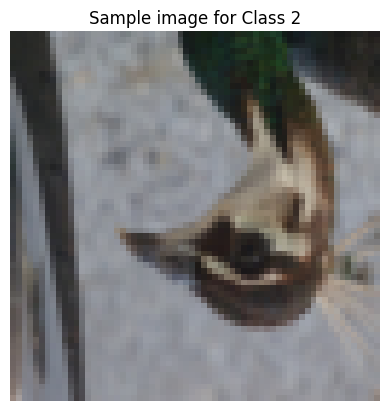

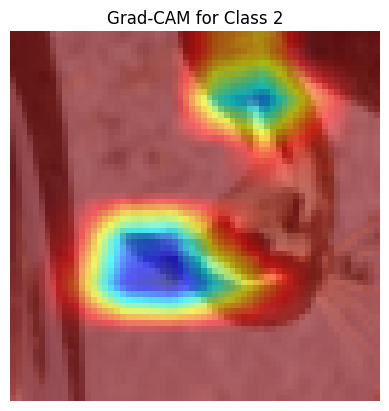

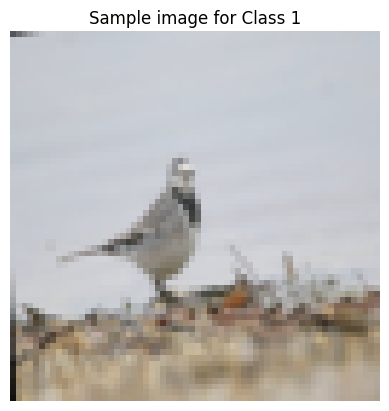

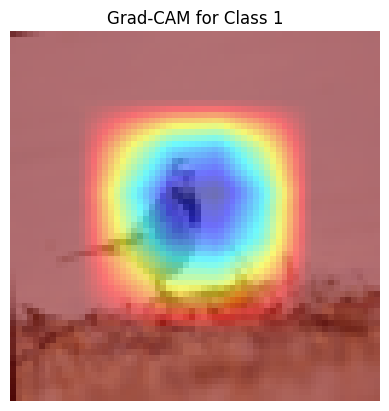

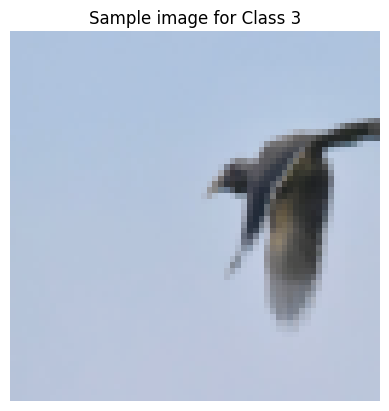

...

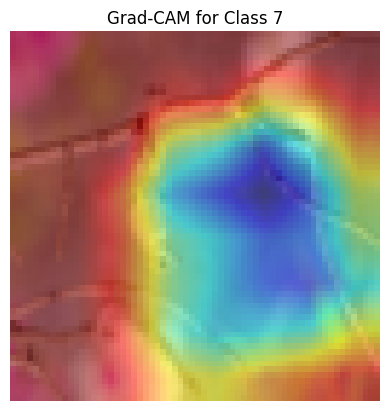

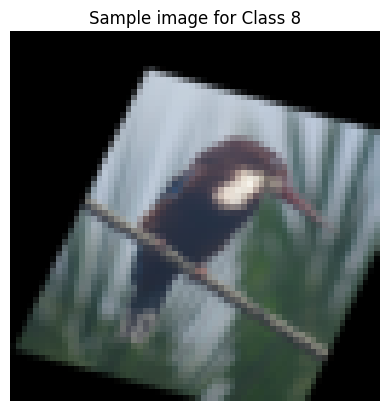

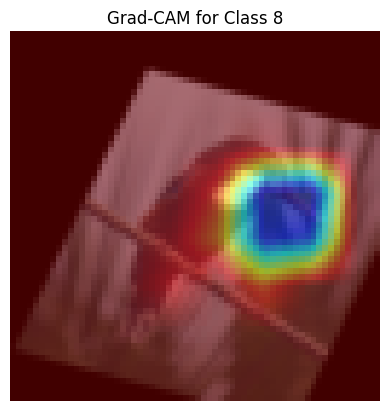

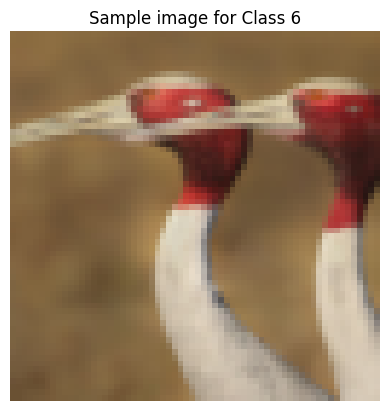

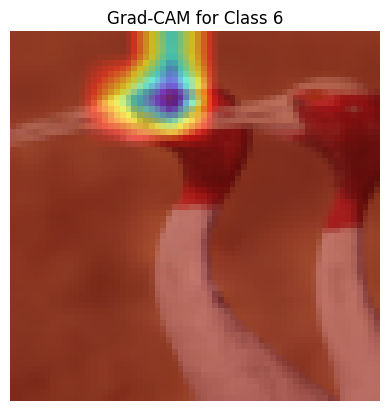

/tmp/ipykernel_30/3049327918.py:57: RuntimeWarning: invalid value encountered in divide
  gradcam = gradcam / np.max(gradcam)


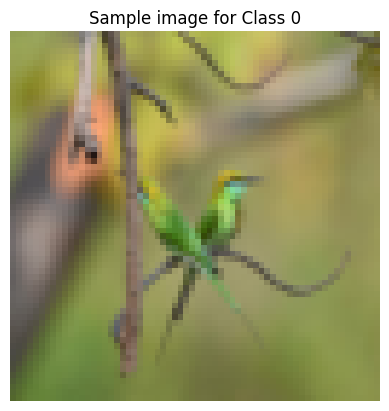

/tmp/ipykernel_30/3049327918.py:118: RuntimeWarning: invalid value encountered in cast
  heatmap = cv2.applyColorMap(np.uint8(255 * gradcam_output), cv2.COLORMAP_JET)


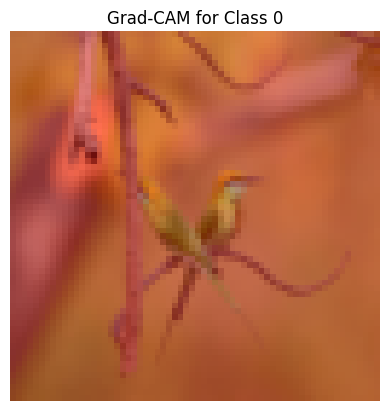

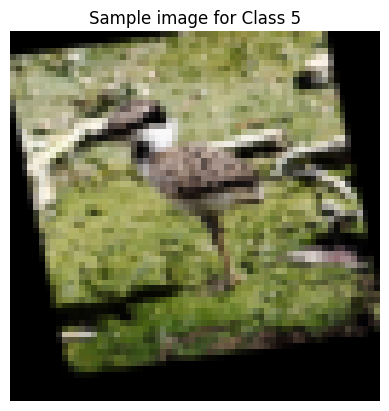

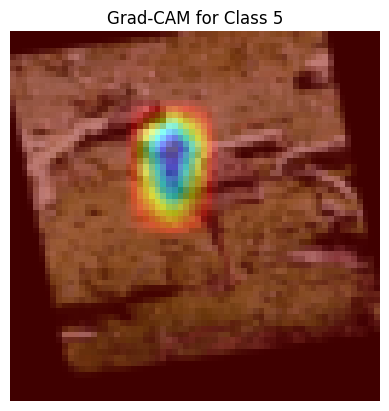

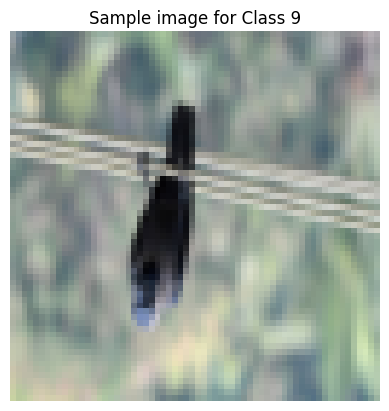

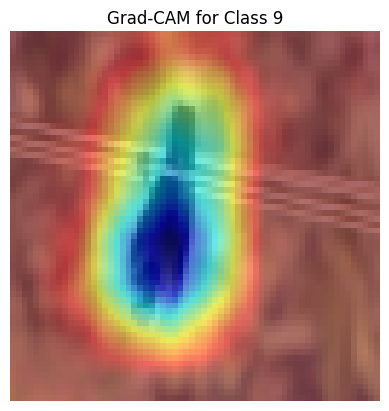

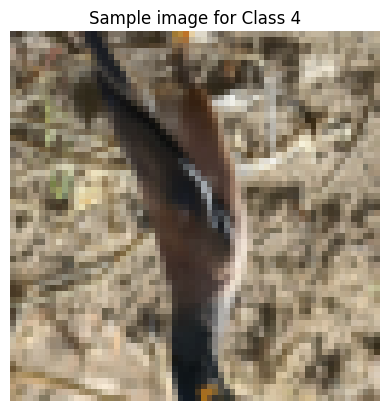

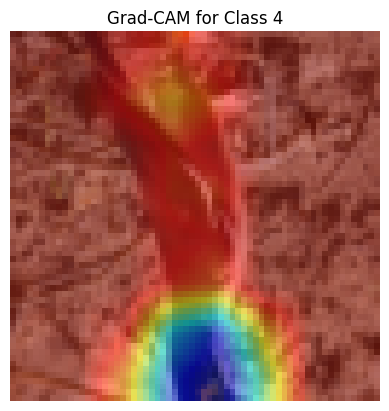

In [13]:
import torch
import torch.nn.functional as F
import numpy as np
import cv2
import matplotlib.pyplot as plt
from torchvision import transforms
from PIL import Image

# Define Grad-CAM class
class GradCAM:
    def __init__(self, model, target_layer):
        self.model = model
        self.target_layer = target_layer
        self.gradients = None
        self.activations = None
        self._register_hooks()

    def _register_hooks(self):
        def forward_hook(module, input, output):
            self.activations = output.detach()

        def backward_hook(module, grad_input, grad_output):
            self.gradients = grad_output[0].detach()

        # Register hooks on the target layer
        self.target_layer.register_forward_hook(forward_hook)
        self.target_layer.register_backward_hook(backward_hook)

    def forward(self, x):
        return self.model(x)

    def __call__(self, x, target_class):
        # Forward pass
        output = self.forward(x)

        # Zero all gradients
        self.model.zero_grad()

        # Backward pass with respect to the target class
        target = output[0][target_class]
        target.backward(retain_graph=True)

        # Get gradients and activations
        gradients = self.gradients.cpu().numpy()[0]
        activations = self.activations.cpu().numpy()[0]

        # Compute the Grad-CAM heatmap
        weights = np.mean(gradients, axis=(1, 2))  # Global average pooling of gradients
        gradcam = np.zeros(activations.shape[1:], dtype=np.float32)

        for i, w in enumerate(weights):
            gradcam += w * activations[i, :, :]

        gradcam = np.maximum(gradcam, 0)  # ReLU
        gradcam = cv2.resize(gradcam, (x.shape[2], x.shape[3]))  # Resize to original image size
        gradcam = gradcam - np.min(gradcam)
        gradcam = gradcam / np.max(gradcam)

        return gradcam

# Load the saved model checkpoint
model = CustomResNet18(BasicBlock, [2, 2, 2, 2], num_classes=10)
model.load_state_dict(torch.load('best_model_CEL_classimbalance_cutmix_changetostepLR.pth'))
model.eval()

# Move the model to GPU if available
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = model.to(device)

# Define the target layer for Grad-CAM (last convolutional layer)
target_layer = model.layer4[-1].conv2  # Choose a convolutional layer

# Initialize Grad-CAM
gradcam = GradCAM(model, target_layer)

# Load a sample image and preprocess it (from validation set)
transform = transforms.Compose([
    transforms.Resize((64, 64)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])
paths = [
    '/kaggle/working/Birds/train/2/2_460.jpg',
    '/kaggle/working/Birds/train/1/1_145.jpg',
    '/kaggle/working/Birds/train/3/3_186.jpg',
    '/kaggle/working/Birds/train/7/7_875.jpg',
    '/kaggle/working/Birds/train/8/8_370.jpg',
    '/kaggle/working/Birds/train/6/6_872.jpg',
    '/kaggle/working/Birds/train/0/0_11.jpg',
    '/kaggle/working/Birds/train/5/5_924.jpg',
    '/kaggle/working/Birds/train/9/9_496.jpg',
    '/kaggle/working/Birds/train/4/4_1129.jpg' 
]

model.eval()
def plot_grad(img_path):
    img = Image.open(img_path)  # Replace with actual image path
    img_tensor = transform(img).unsqueeze(0).to(device)  # Add batch dimension and move to device

    output = model(img_tensor)
    _, predicted_class = output.max(1)
    predicted_class = predicted_class.item()

    gradcam_output = gradcam(img_tensor, predicted_class)

    def denormalize(tensor, mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]):
        for t, m, s in zip(tensor, mean, std):
            t.mul_(s).add_(m)
        return tensor

    img_for_visualization = denormalize(img_tensor[0].cpu()).permute(1, 2, 0).numpy()
    plt.imshow(img_for_visualization)
    plt.title(f"Sample image for Class {predicted_class}")
    plt.axis('off')
    plt.show()
    
    # Overlay Grad-CAM on the original image
    heatmap = cv2.applyColorMap(np.uint8(255 * gradcam_output), cv2.COLORMAP_JET)
    heatmap = np.float32(heatmap) / 255
    cam_img = heatmap + np.float32(img_for_visualization)
    cam_img = cam_img / np.max(cam_img)

    # Show the image with Grad-CAM
    plt.imshow(cam_img)
    plt.title(f"Grad-CAM for Class {predicted_class}")
    plt.axis('off')
    plt.show()

for path in paths:
    plot_grad(path)
    

In [17]:
import torch
import torch.nn.functional as F
import numpy as np
import cv2
import matplotlib.pyplot as plt
from torchvision import transforms
from PIL import Image
import os
import csv

# Define Grad-CAM class
class GradCAM:
    def __init__(self, model, target_layer):
        self.model = model
        self.target_layer = target_layer
        self.gradients = None
        self.activations = None
        self._register_hooks()

    def _register_hooks(self):
        def forward_hook(module, input, output):
            self.activations = output.detach()

        def backward_hook(module, grad_input, grad_output):
            self.gradients = grad_output[0].detach()

        # Register hooks on the target layer
        self.target_layer.register_forward_hook(forward_hook)
        self.target_layer.register_backward_hook(backward_hook)

    def forward(self, x):
        return self.model(x)

    def __call__(self, x, target_class):
        # Forward pass
        output = self.forward(x)

        # Zero all gradients
        self.model.zero_grad()

        # Backward pass with respect to the target class
        target = output[0][target_class]
        target.backward(retain_graph=True)

        # Get gradients and activations
        gradients = self.gradients.cpu().numpy()[0]
        activations = self.activations.cpu().numpy()[0]

        # Compute the Grad-CAM heatmap
        weights = np.mean(gradients, axis=(1, 2))  # Global average pooling of gradients
        gradcam = np.zeros(activations.shape[1:], dtype=np.float32)

        for i, w in enumerate(weights):
            gradcam += w * activations[i, :, :]

        gradcam = np.maximum(gradcam, 0)  # ReLU
        gradcam = cv2.resize(gradcam, (x.shape[2], x.shape[3]))  # Resize to original image size
        gradcam = gradcam - np.min(gradcam)
        gradcam = gradcam / np.max(gradcam)

        return gradcam

# Load the saved model checkpoint
model = CustomResNet18(BasicBlock, [2, 2, 2, 2], num_classes=10)
model.load_state_dict(torch.load('best_model_CEL_classimbalance_cutmix_changetostepLR.pth'))
model.eval()

# Move the model to GPU if available
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = model.to(device)

# Define the target layer for Grad-CAM (last convolutional layer)
target_layer = model.layer4[-1].conv2  # Choose a convolutional layer

# Initialize Grad-CAM
gradcam = GradCAM(model, target_layer)

# Load a sample image and preprocess it (from validation set)
transform = transforms.Compose([
    transforms.Resize((64, 64)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])
paths = [
    '/kaggle/working/Birds/train/2/2_460.jpg',
    '/kaggle/working/Birds/train/1/1_145.jpg',
    '/kaggle/working/Birds/train/3/3_186.jpg',
    '/kaggle/working/Birds/train/7/7_875.jpg',
    '/kaggle/working/Birds/train/8/8_370.jpg',
    '/kaggle/working/Birds/train/6/6_872.jpg',
    '/kaggle/working/Birds/train/0/0_11.jpg',
    '/kaggle/working/Birds/train/5/5_924.jpg',
    '/kaggle/working/Birds/train/9/9_496.jpg',
    '/kaggle/working/Birds/train/4/4_1129.jpg' 
]

model.eval()

def plot_and_save_grad(img_path, save_path, csv_writer):
    img = Image.open(img_path)  # Replace with actual image path
    img_tensor = transform(img).unsqueeze(0).to(device)  # Add batch dimension and move to device

    output = model(img_tensor)
    _, predicted_class = output.max(1)
    predicted_class = predicted_class.item()

    # Save image class and predicted class to CSV
    true_class = int(os.path.basename(os.path.dirname(img_path)))
    csv_writer.writerow([os.path.basename(img_path), true_class, predicted_class])

    gradcam_output = gradcam(img_tensor, predicted_class)

    def denormalize(tensor, mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]):
        for t, m, s in zip(tensor, mean, std):
            t.mul_(s).add_(m)
        return tensor

    img_for_visualization = denormalize(img_tensor[0].cpu()).permute(1, 2, 0).numpy()
    img_for_visualization = np.clip(img_for_visualization, 0, 1)

    # Overlay Grad-CAM on the original image
    heatmap = cv2.applyColorMap(np.uint8(255 * gradcam_output), cv2.COLORMAP_JET)
    heatmap = np.float32(heatmap) / 255
    cam_img = heatmap + np.float32(img_for_visualization)
    cam_img = cam_img / np.max(cam_img)

    # Convert images to uint8 format
    original_img = (img_for_visualization * 255).astype(np.uint8)
    cam_img = (cam_img * 255).astype(np.uint8)

    # Concatenate original and Grad-CAM images side by side
    combined_img = np.concatenate((original_img, cam_img), axis=1)

    # Save the combined image as PNG
    save_filename = os.path.join(save_path, os.path.basename(img_path).replace('.jpg', '_gradcam.png'))
    cv2.imwrite(save_filename, cv2.cvtColor(combined_img, cv2.COLOR_RGB2BGR))

# Directory to save the Grad-CAM results
save_dir = '/kaggle/working/GradCAM_results'
os.makedirs(save_dir, exist_ok=True)

# CSV file to save image classes and predicted classes
csv_file_path = os.path.join(save_dir, 'image_predictions.csv')
with open(csv_file_path, mode='w', newline='') as csv_file:
    csv_writer = csv.writer(csv_file)
    csv_writer.writerow(['Image Name', 'True Class', 'Predicted Class'])
    
    for path in paths:
        plot_and_save_grad(path, save_dir, csv_writer)


/tmp/ipykernel_30/968139608.py:65: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load('best_model_CEL_classimbalance_cutmix_changetostepLR.pth'))

In [22]:
import torch
import torch.nn.functional as F
import numpy as np
import cv2
import matplotlib.pyplot as plt
from torchvision import transforms
from PIL import Image, ImageDraw, ImageFont
import os
import csv

# Define Grad-CAM class
class GradCAM:
    def __init__(self, model, target_layer):
        self.model = model
        self.target_layer = target_layer
        self.gradients = None
        self.activations = None
        self._register_hooks()

    def _register_hooks(self):
        def forward_hook(module, input, output):
            self.activations = output.detach()

        def backward_hook(module, grad_input, grad_output):
            self.gradients = grad_output[0].detach()

        # Register hooks on the target layer
        self.target_layer.register_forward_hook(forward_hook)
        self.target_layer.register_backward_hook(backward_hook)

    def forward(self, x):
        return self.model(x)

    def __call__(self, x, target_class):
        # Forward pass
        output = self.forward(x)

        # Zero all gradients
        self.model.zero_grad()

        # Backward pass with respect to the target class
        target = output[0][target_class]
        target.backward(retain_graph=True)

        # Get gradients and activations
        gradients = self.gradients.cpu().numpy()[0]
        activations = self.activations.cpu().numpy()[0]

        # Compute the Grad-CAM heatmap
        weights = np.mean(gradients, axis=(1, 2))  # Global average pooling of gradients
        gradcam = np.zeros(activations.shape[1:], dtype=np.float32)

        for i, w in enumerate(weights):
            gradcam += w * activations[i, :, :]

        gradcam = np.maximum(gradcam, 0)  # ReLU
        gradcam = cv2.resize(gradcam, (x.shape[2], x.shape[3]))  # Resize to original image size
        gradcam = gradcam - np.min(gradcam)
        gradcam = gradcam / np.max(gradcam)

        return gradcam

# Load the saved model checkpoint
model = CustomResNet18(BasicBlock, [2, 2, 2, 2], num_classes=10)
model.load_state_dict(torch.load('best_model_CEL_classimbalance_cutmix_changetostepLR.pth'))
model.eval()

# Move the model to GPU if available
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = model.to(device)

# Define the target layer for Grad-CAM (last convolutional layer)
target_layer = model.layer4[-1].conv2  # Choose a convolutional layer

# Initialize Grad-CAM
gradcam = GradCAM(model, target_layer)

# Load a sample image and preprocess it (from validation set)
transform = transforms.Compose([
    transforms.Resize((64, 64)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])
paths = [
    '/kaggle/working/Birds/train/2/2_460.jpg',
    '/kaggle/working/Birds/train/1/1_145.jpg',
    '/kaggle/working/Birds/train/3/3_186.jpg',
    '/kaggle/working/Birds/train/7/7_875.jpg',
    '/kaggle/working/Birds/train/8/8_370.jpg',
    '/kaggle/working/Birds/train/6/6_872.jpg',
    '/kaggle/working/Birds/train/0/0_11.jpg',
    '/kaggle/working/Birds/train/5/5_924.jpg',
    '/kaggle/working/Birds/train/9/9_496.jpg',
    '/kaggle/working/Birds/train/4/4_1129.jpg' 
]

model.eval()

def plot_and_save_grad(img_path, save_path, csv_writer):
    img = Image.open(img_path)  # Replace with actual image path
    img_tensor = transform(img).unsqueeze(0).to(device)  # Add batch dimension and move to device

    output = model(img_tensor)
    _, predicted_class = output.max(1)
    predicted_class = predicted_class.item()

    # Save image class and predicted class to CSV
    true_class = int(os.path.basename(os.path.dirname(img_path)))
    csv_writer.writerow([os.path.basename(img_path), true_class, predicted_class])

    gradcam_output = gradcam(img_tensor, predicted_class)

    def denormalize(tensor, mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]):
        for t, m, s in zip(tensor, mean, std):
            t.mul_(s).add_(m)
        return tensor

    img_for_visualization = denormalize(img_tensor[0].cpu()).permute(1, 2, 0).numpy()
    img_for_visualization = np.clip(img_for_visualization, 0, 1)

    # Overlay Grad-CAM on the original image
    heatmap = cv2.applyColorMap(np.uint8(255 * gradcam_output), cv2.COLORMAP_JET)
    heatmap = np.float32(heatmap) / 255
    cam_img = heatmap + np.float32(img_for_visualization)
    cam_img = cam_img / np.max(cam_img)

    # Convert images to uint8 format
    original_img = (img_for_visualization * 255).astype(np.uint8)
    cam_img = (cam_img * 255).astype(np.uint8)

    # Resize both images to 500x500
    original_img = cv2.resize(original_img, (500, 500))
    cam_img = cv2.resize(cam_img, (500, 500))

    # Concatenate original and Grad-CAM images side by side
    combined_img = np.concatenate((original_img, cam_img), axis=1)

    # Convert to PIL image for adding text
    combined_img_pil = Image.fromarray(combined_img)
    draw = ImageDraw.Draw(combined_img_pil)
    font = ImageFont.load_default()
    text = f"True Class: {true_class}, Predicted Class: {predicted_class}"
    #draw.text((500, 500), text, fill=(255, 255, 255), font=font)
    try:
        font = ImageFont.truetype("DejaVuSans-Bold.ttf", size=24)
    except IOError:
        font = ImageFont.load_default(size=24)
    draw.text((10, 10), text, fill=(255, 255, 255), font=font)

    # Save the combined image as PNG
    save_filename = os.path.join(save_path, os.path.basename(img_path).replace('.jpg', '_gradcam.png'))
    combined_img_pil.save(save_filename)

# Directory to save the Grad-CAM results
save_dir = '/kaggle/working/GradCAM_results2/'
os.makedirs(save_dir, exist_ok=True)

# CSV file to save image classes and predicted classes
csv_file_path = os.path.join(save_dir, 'image_predictions.csv')
with open(csv_file_path, mode='w', newline='') as csv_file:
    csv_writer = csv.writer(csv_file)
    csv_writer.writerow(['Image Name', 'True Class', 'Predicted Class'])
    
    for path in paths:
        plot_and_save_grad(path, save_dir, csv_writer)


/tmp/ipykernel_30/3375707459.py:65: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load('best_model_CEL_classimbalance_cutmix_changetostepLR.pth')